## Getting the Sift1M Data

In [56]:
import shutil
import urllib.request as request
from contextlib import closing
import faiss  # Facebook AI Similarity Search

with closing(request.urlopen('ftp://ftp.irisa.fr/local/texmex/corpus/sift.tar.gz')) as r:
    with open('sift.tar.gz', 'wb') as f:
        shutil.copyfileobj(r,f)

In [57]:
import tarfile

# the download leaves us with a tar.gz file, we unzip it
tar = tarfile.open('sift.tar.gz', "r:gz") # Extracting all the files from the tar file
tar.extractall()

In [58]:
import numpy as np

# now define a function to read the fvecs file format of Sift1M dataset in the notebook
def read_fvecs(fp):
    a = np.fromfile(fp, dtype='int32')
    d = a[0]
    return a.reshape(-1, d + 1)[:, 1:].copy().view('float32')

In [59]:
# data we will search through
xb = read_fvecs('./sift/sift_base.fvecs')  # 1M samples
# also get some query vectors to search with
xq = read_fvecs('./sift/sift_query.fvecs')
# take just one query (there are many in sift_learn.fvecs)
xq = xq[0].reshape(1, xq.shape[1])

In [60]:
xq.shape  # Query vector

(1, 128)

In [61]:
xb.shape  # Base vector

(1000000, 128)

In [62]:
xq

array([[  1.,   3.,  11., 110.,  62.,  22.,   4.,   0.,  43.,  21.,  22.,
         18.,   6.,  28.,  64.,   9.,  11.,   1.,   0.,   0.,   1.,  40.,
        101.,  21.,  20.,   2.,   4.,   2.,   2.,   9.,  18.,  35.,   1.,
          1.,   7.,  25., 108., 116.,  63.,   2.,   0.,   0.,  11.,  74.,
         40., 101., 116.,   3.,  33.,   1.,   1.,  11.,  14.,  18., 116.,
        116.,  68.,  12.,   5.,   4.,   2.,   2.,   9., 102.,  17.,   3.,
         10.,  18.,   8.,  15.,  67.,  63.,  15.,   0.,  14., 116.,  80.,
          0.,   2.,  22.,  96.,  37.,  28.,  88.,  43.,   1.,   4.,  18.,
        116.,  51.,   5.,  11.,  32.,  14.,   8.,  23.,  44.,  17.,  12.,
          9.,   0.,   0.,  19.,  37.,  85.,  18.,  16., 104.,  22.,   6.,
          2.,  26.,  12.,  58.,  67.,  82.,  25.,  12.,   2.,   2.,  25.,
         18.,   8.,   2.,  19.,  42.,  48.,  11.]], dtype=float32)

In [63]:
import sys
print(sys.executable)


/Users/vaishnaviverma/.pyenv/versions/3.11.7/bin/python


## Flat Index

These are basically searching through the whole data and finding the top k nearest (most similar) vectors. These are exhaustive search and checks the distance between the query vector and every other vector.

- 100% in search quality (best search results)
- Takes the most time (slowest)

#### When to use:
- When you don't have a big dataset
- You don't care about time

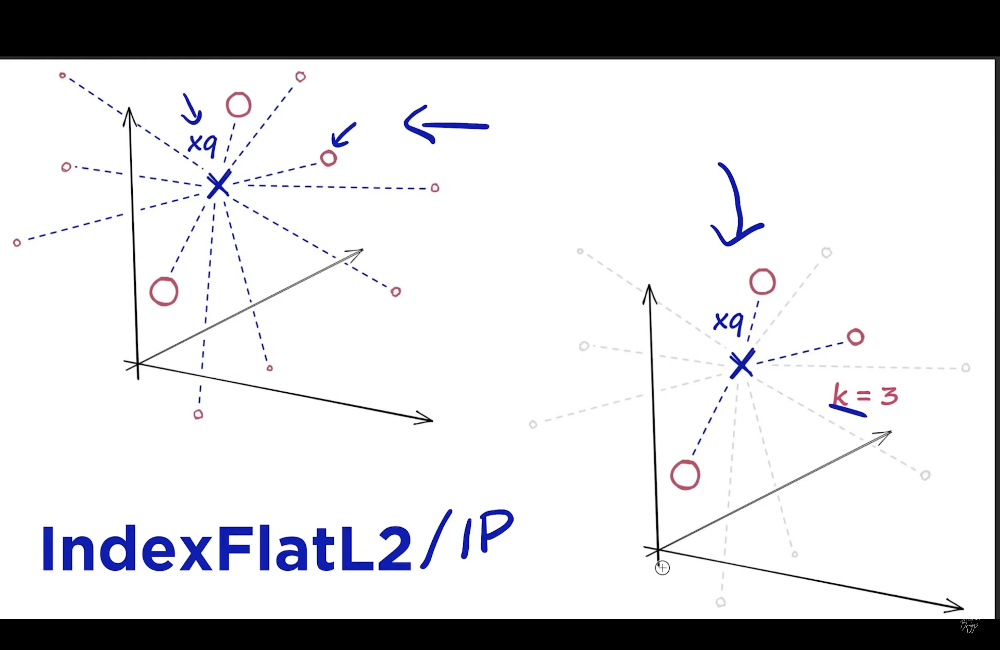

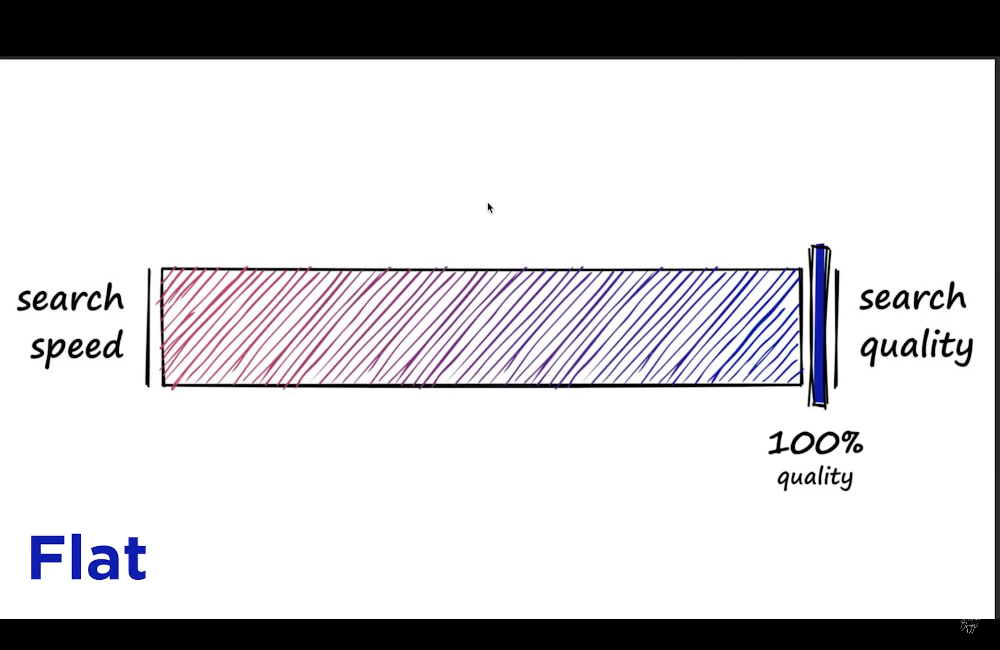

In [64]:
d = 128 # dimensionality
k = 10 #no of results

import faiss

index = faiss.IndexFlatIP(d)  # There are 2 options for Flat index, IP and L2, we chose IP cause its slightly faster
index.add(xb)

In [65]:
%%time
D, I = index.search(xq, k) # pass the query vector and samples to return

CPU times: user 19.8 ms, sys: 7.06 ms, total: 26.9 ms
Wall time: 33.4 ms


In [66]:
I #The 10 most similar vectors to xq

array([[932085, 934876, 561813, 708177, 706771, 695756, 435345, 701258,
        872728, 455537]])

In [67]:
baseline = I[0].tolist()
baseline

[932085,
 934876,
 561813,
 708177,
 706771,
 695756,
 435345,
 701258,
 872728,
 455537]

## LSH (Locality Sensitive Hashing)

Works by grouping vectors into buckets. Typically, hashing functions try to minimize collisions (2 items being mapped to the same group/bucket) otherwise it increases the complexity of extracting a single value. However, LSH is different, here we try to maximize collisions, so we get groupings of our values. 

Now, when the time comes for search, we pass our query through the same hashing function which pushes it to one of the hasing buckets. In case its pushed to an empty bucket, we using hamming distance to find the nearest bucket. Once we find the bucket, we restrict our search scope to that particular bucket, which means we don't have to search everything.

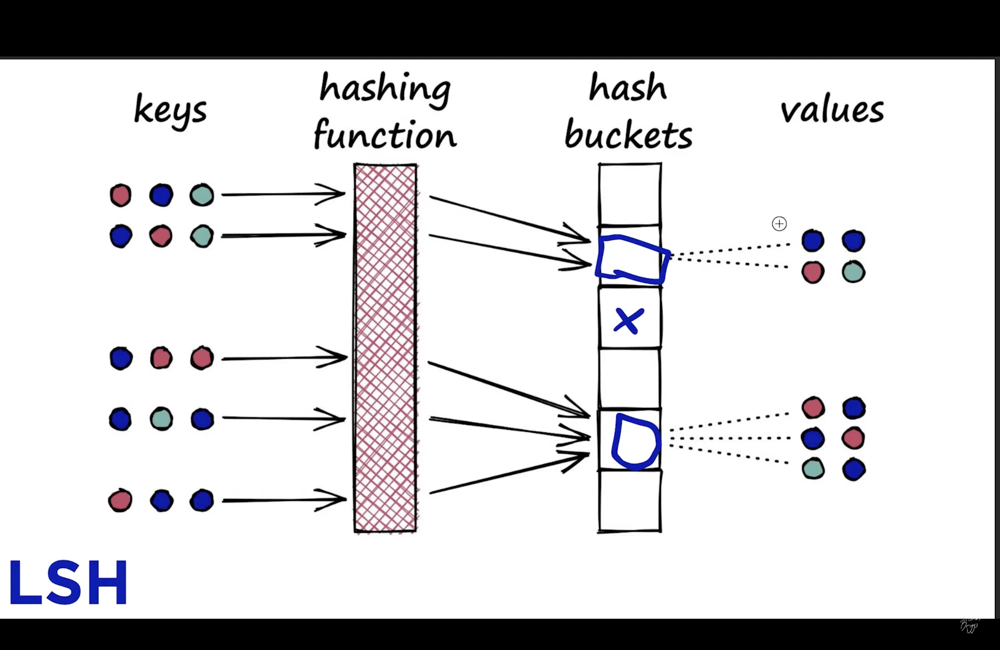

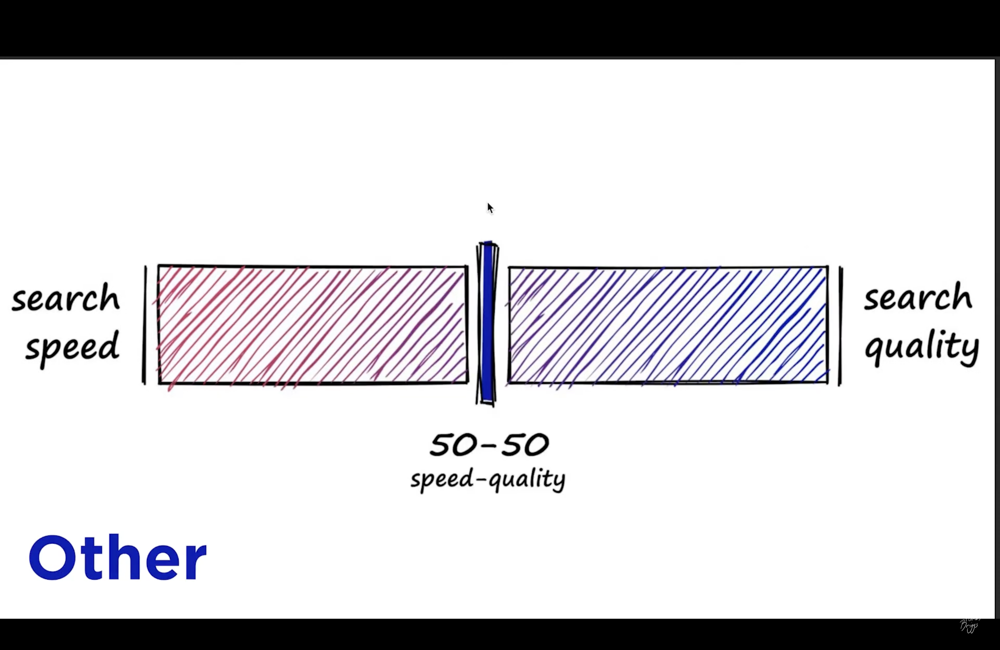

In [68]:
nbits = d*4   # can be scaled based on dimensionality

#nbits can be increased to increase the accuracy of our results, 
# or decrease it to increase the speed

index= faiss.IndexLSH(d, nbits)
index.add(xb)

In [69]:
%%time

D, I = index.search(xq, k)

CPU times: user 3.51 ms, sys: 3.37 ms, total: 6.87 ms
Wall time: 4.56 ms


In [70]:
#Compare this search result to the flat one (100% accuracy)

np.in1d(baseline, I)

#Result: Slightly less accurate but much faster

array([ True,  True,  True,  True, False, False,  True, False, False,
        True])

#### Results:

The LSH performs much faster when nbits are less (d*2, d*4, etc). However, once we start increasing the complexity (nbits), the performance becomes much slower but the accuracy goes up.

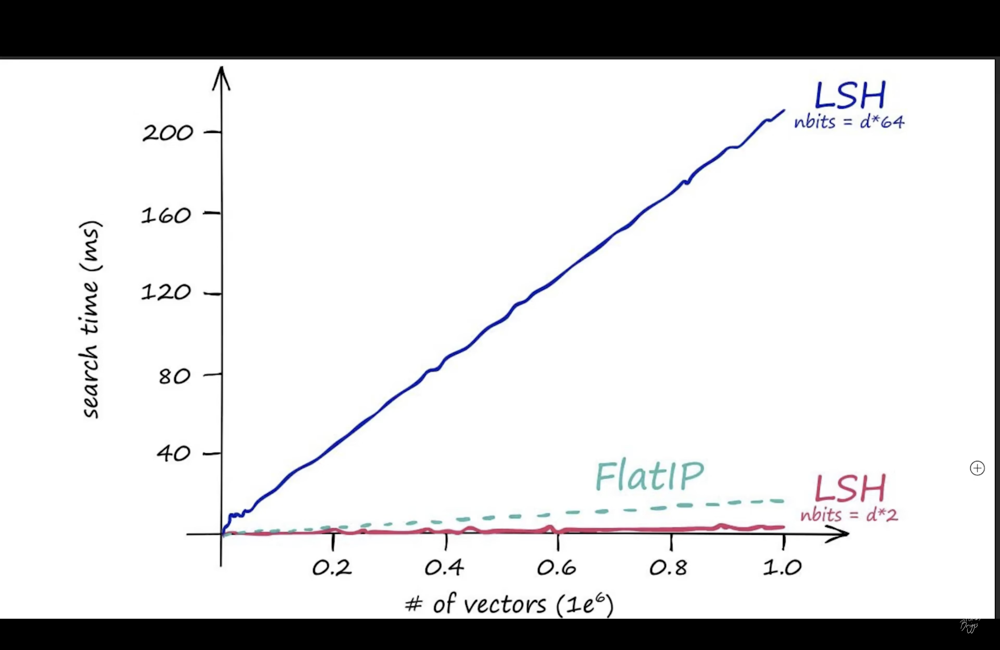
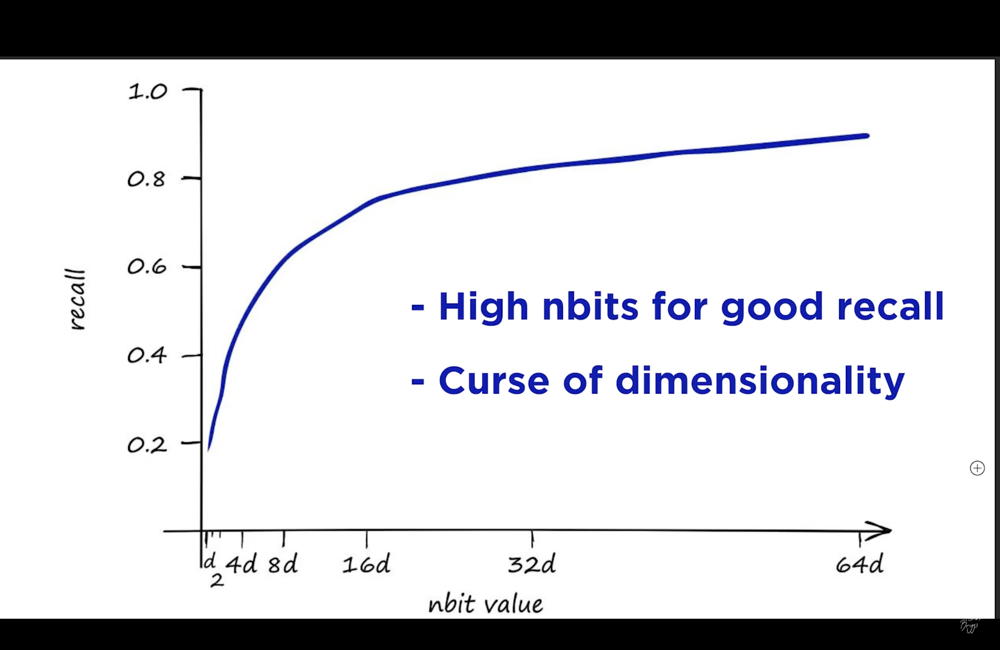

## HNSW (Hierarchial Navigable Small World)

#### NSW Graphs:

While the graph itself can be very large, but the number of hops (steps) between any two vertexes is low.

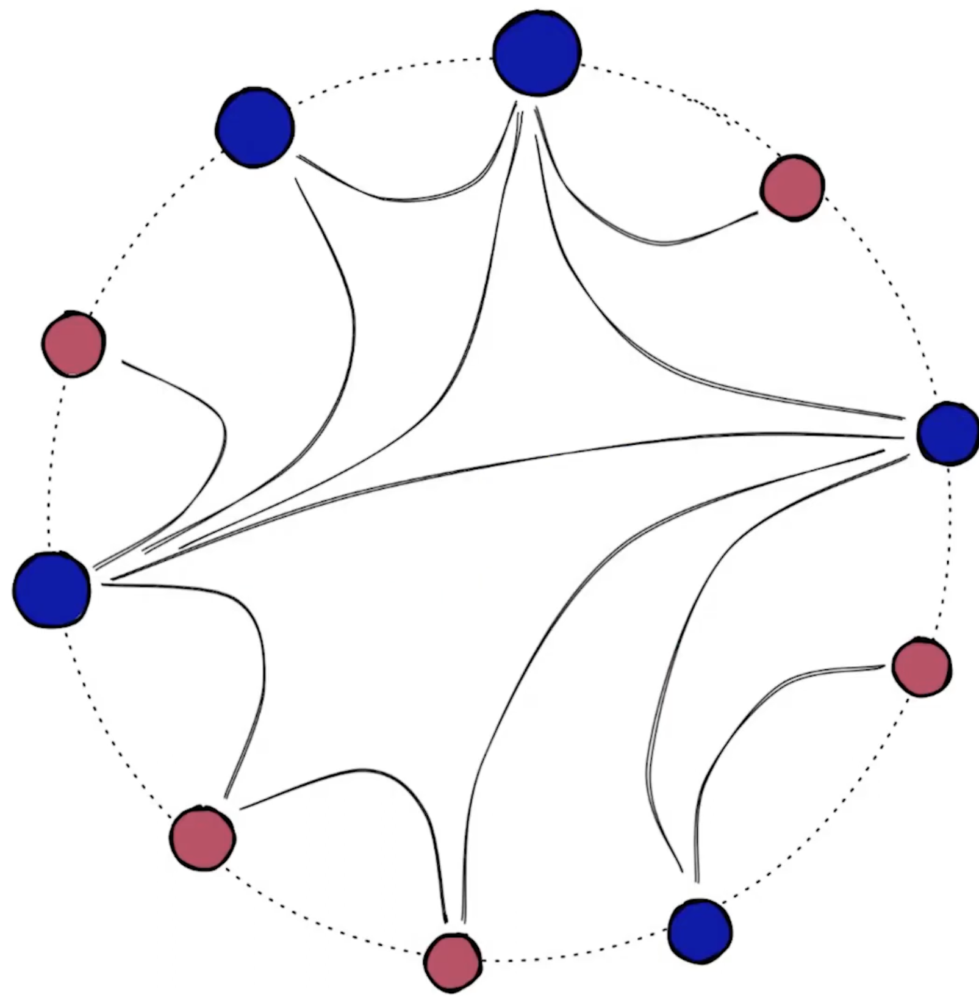

#### Hierarchial Navigable Small World Graph

Built the same way as NSW but split across multiple layers. 

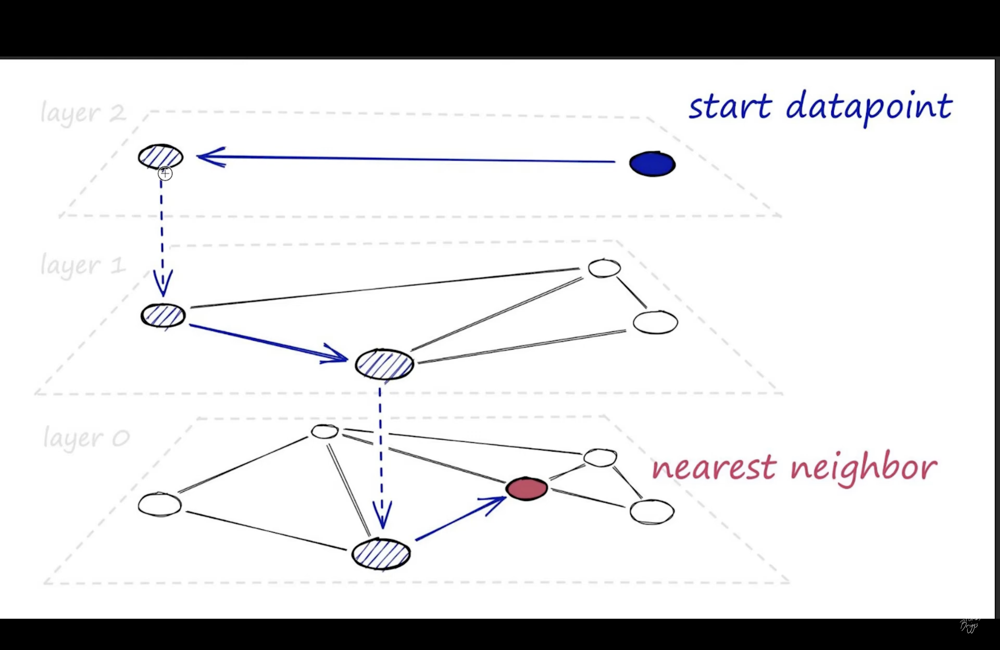

In [81]:
M = 16 # number of connections each vertex has (more connectivity = less no of hops = more accuracy)

ef_search = 32 # the depth of search (the no of adjacent nodes to consider while search)

ef_construction = 64 # how much of the actual network will we search during the construction of the network.
# Essentially, how efficiently and accurately we are building the network. It will increase the construction
# time but will have no effect of search time so its better to take a higher number

In [82]:
index = faiss.IndexHNSWFlat(d, M)  #Other options can make it faster but slightly less accurate
index.hnsw.efSearch = ef_search
index.hnsw.efConstruction = ef_construction

index.add(xb)

In [83]:
%%time

D, I = index.search(xq, k)

CPU times: user 329 μs, sys: 361 μs, total: 690 μs
Wall time: 646 μs


In [84]:
np.in1d(baseline, I)

#Update m to 16 and ef_search to 32, and you essentially have the same accuracy as 
#LSH, but with much less time taken

array([ True,  True, False,  True,  True,  True, False,  True,  True,
        True])

#### Results:

With the initial setup, the accuracy provided by HNSW was much less as compared to the others, but the time taken was astonisingly less (in microseconds). When updated with more M and ef_search, the accuracy was comparable to LSH, and the time taken was mindblowingly low.

HSNW is one of the most used indexing techiques for the following reasons:
- Speed
- Flexibility

A lot of the state of the art techniques are HNSW or based on HNSW

Con:
- Index size is massive so needs to be taken into account.

## IVF (Inverted File Index)

Based on essentially clustering the data points. Around each or based in centroid we expand a catchment radius and where these circles collide are going to our edges of the catchment cells. This is called Voronoi Diagram or Dirichlet Tessellation.

This is the way we create the cells. In each of these cells, the data points within that cell will be allocated to the centroid of that cell. When you search, the xq value or the query value will be compared to every centroid but not all data points. From that, you find our which centroid is the closest to the query vector. Then we restrict our search scope to only that cell and then we calculate the nearest vector. nprobe defines the number of cells we search.

#### Edge Problem: 

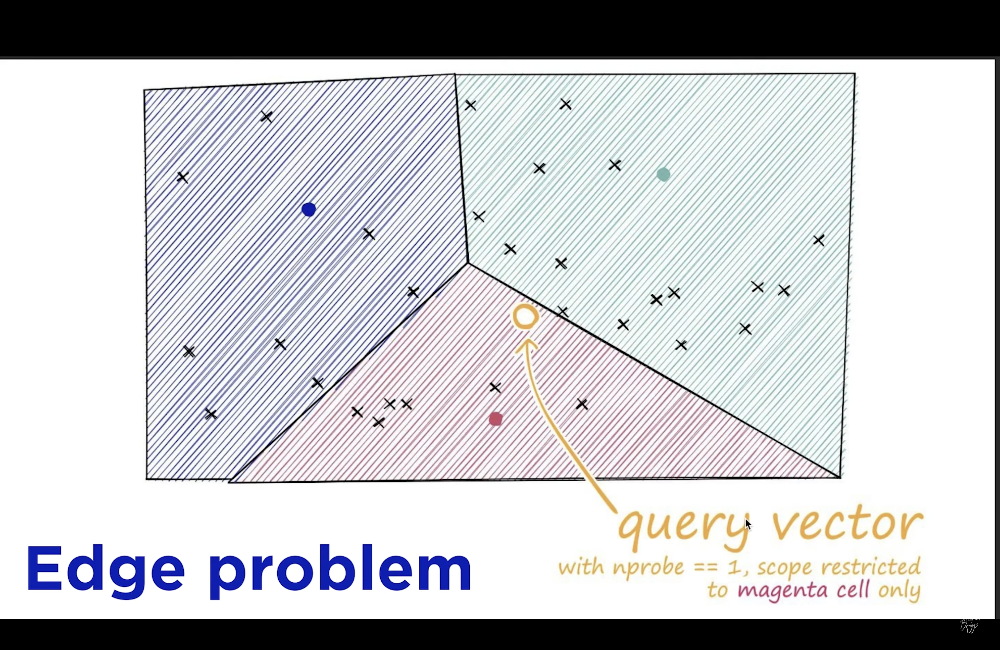

Let's say we have query vector which is closer to data points in other cells but far from those cells' centroid and as a result it put into different (and closest centroid) cell. In this case, we do not take into consideration the data points which might be closer but in different cell.

_Solution:_ increase the nprobe size and search more nearest centroid cells.


In [75]:
nlist = 128 # Number of clusters/centroids that we want

quantizer = faiss.IndexFlatIP(d)
index = faiss.IndexIVFFlat(quantizer, d, nlist)

In [76]:
index.train(xb) # we need to train our index before using, unlike other indexes

In [77]:
index.add(xb)

In [78]:
index.nprobe = 1 

In [79]:
%%time

D, I = index.search(xq, k)

CPU times: user 654 μs, sys: 239 μs, total: 893 μs
Wall time: 585 μs


In [80]:
np.in1d(baseline, I)

array([ True, False, False,  True,  True, False, False,  True, False,
        True])

#### Results:

This one is really fast, giving better accuracy than HNSW with d*2 at nprobe = 1. Upon playing around and increasing the nprobe value to 4, we get perfect results, again in very less time.  

Interms of Index Size, increasing the nlist doesnt impact it much.